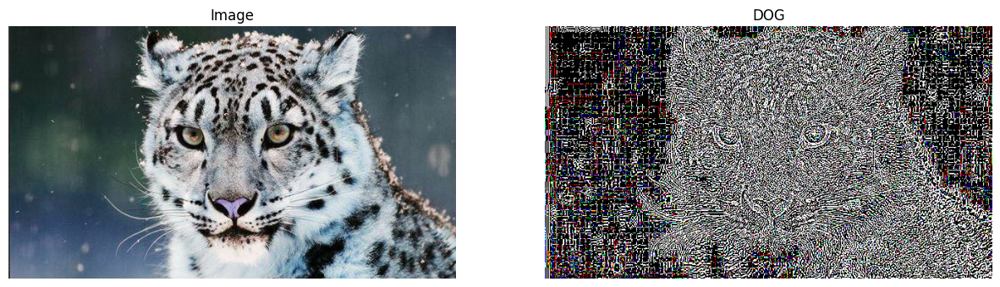

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os

pic1 = cv2.imread("img1.jpg")
pic2 = cv2.imread("img2.jpg")
pic3 = cv2.imread("img3.jpg")

pic1_gray = cv2.cvtColor(pic1, cv2.COLOR_BGR2GRAY)
pic2_gray = cv2.cvtColor(pic2, cv2.COLOR_BGR2GRAY)
pic3_gray = cv2.cvtColor(pic3, cv2.COLOR_BGR2GRAY)

gaussian1 = cv2.GaussianBlur(pic1, (1, 1), 0)
gaussian2 = cv2.GaussianBlur(pic1, (3, 3), 0)

dog = gaussian1 - gaussian2

plt.figure(figsize=(15, 9))

plt.subplot(1, 2, 1)
plt.imshow(pic1, cmap='gray')
plt.title('Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(dog, cmap='gray')
plt.title('DOG')
plt.axis('off')


plt.show()



توانسته ایم (DOG) در سل بالا، با کاستن یک فیلتر گوسی با انحراف معیار بالاتر از یک فیلتر گوسی با انحراف معیار پایین تر  

را تخمین بزنیم و خروجی را در بالا مشاهده میکنیدLOG  فیلتر   

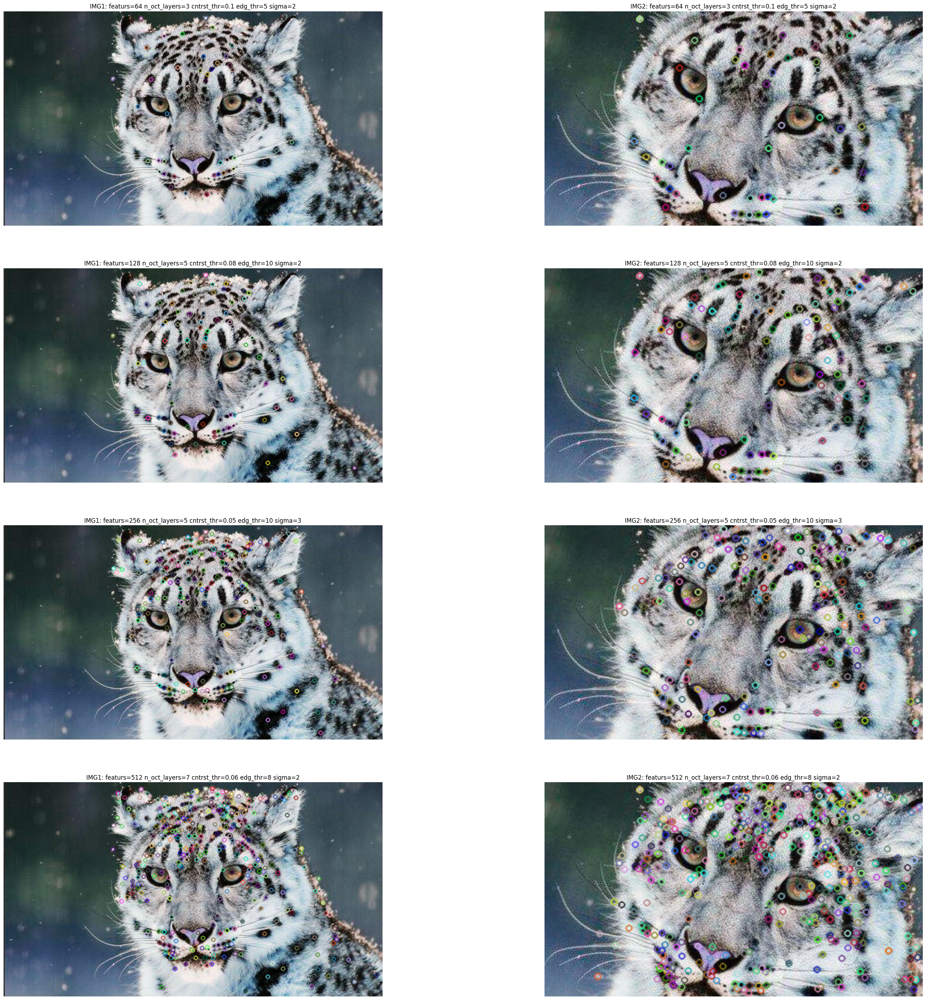

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

plt.figure(figsize=(36, 36))
features = [[64, 3, 0.1, 5, 2], [128, 5, 0.08, 10, 2], [256, 5, 0.05, 10, 3], [512, 7, 0.06, 8, 2]]
for idx, params in enumerate(features):
    sift = cv2.SIFT_create(
        nfeatures=params[0],  
        nOctaveLayers=params[1], 
        contrastThreshold=params[2],  
        edgeThreshold=params[3],  
        sigma=params[4]  
    )

    keypoints1, descriptors1 = sift.detectAndCompute(pic1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(pic2, None)

    img1_with_keypoints = cv2.drawKeypoints(pic1, keypoints1, None)
    img2_with_keypoints = cv2.drawKeypoints(pic2, keypoints2, None)
    
    plt.subplot(4, 2, 2*idx+1)
    plt.imshow(img1_with_keypoints, cmap='gray'), plt.axis('off')
    plt.title(f'IMG1: featurs={params[0]} n_oct_layers={params[1]} cntrst_thr={params[2]} edg_thr={params[3]} sigma={params[4]}')

    plt.subplot(4, 2, 2*idx+2)
    plt.imshow(img2_with_keypoints, cmap='gray'), plt.axis('off')
    plt.title(f'IMG2: featurs={params[0]} n_oct_layers={params[1]} cntrst_thr={params[2]} edg_thr={params[3]} sigma={params[4]}')

plt.show()


تعداد نقاط کلیدی دلخواه ما را نگه میدارد nfeature پارامتر 

تعداد لایه های گوسی هر لایه اکتاو را مشخص میکند nOctaveLayers پارامتر 

معیاری است برای تشخیص کلیدی بودن یک پیکسل برحسب اندازه آن در مقایسه با همسایگان contrastThreshold پارامتر 

معیاری است برای تشخیص کلیدی بودن یک پیکسل برحسب اینکه پیکسل یاد شده صرفا به دلیل لبه بودن کلیدی نشده باشد  edgeThreshold پارامتر 

سیگمای شروع گوسی های اکتاو اول را تعیین میکند که در پی آن سایر گوسی ها نیز مشخص میشوند. sigma پارامتر 


در تصویر بالا برای پارامتر ها با مقادیر مختلف نقاط کلیدی را یافته ایم که میتوانید در بالا مشاهده کنید.





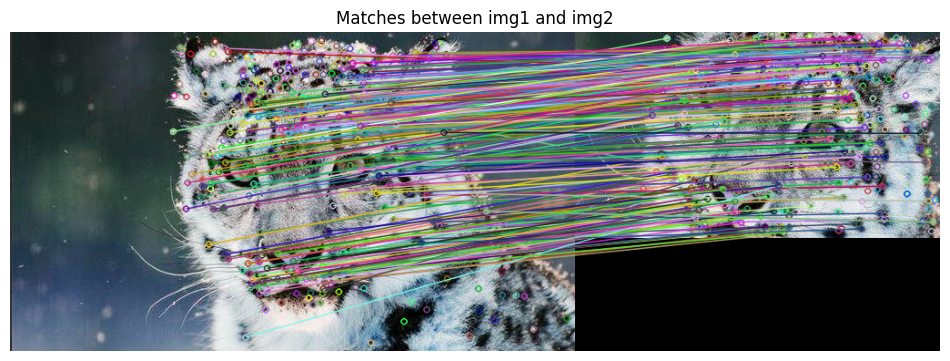

In [14]:
bf = cv2.BFMatcher()

matches = bf.knnMatch(descriptors1, descriptors2, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.8 * n.distance:
        good_matches.append(m)

img_matches = cv2.drawMatches(pic1, keypoints1, pic2, keypoints2, good_matches, None)

plt.figure(figsize=(12,16))
plt.imshow(img_matches)
plt.title('Matches between img1 and img2'), plt.axis('off')
plt.show()


و فاصله اقلیدوسی، دو نزدیک ترین و شبیه ترین KNN در بالا و در ابتدا میان تمام ویژگی های یافت شده برای دو تصویر، بر اساس معیار

نقاط کلیدی رو برای هر نقطه کلیدی در تصویر دیگر ذخیره کرده ایم. سپس برای اینکه اثر نویز یا نقاط کلیدی نامطلوب را حذف کنیم، بررسی کرده ایم که 
فاصله نقطه کلیدی اول یافته شده تا نقطه کلیدی تارگت در تصویر دیگر، حداکثر 80 درصد نقطه کلیدی دوم فاصله داشته باشد.

مورد قبول انتخاب میشود و تناظر برقرار میشود در غیر این صورت اصلا برای آن مچ  Match اگر این شرط را دارا بود به عنوان یک 
نقطه کلیدی تناظری انتخاب نمیشود. همانطور که در تصویر فوق نیز میبینید برخی از این نقاط کلیدی متناظری در تصویر دیگر ندارند که به همین علت است.

اگر این شرط را حذف کنیم اتفاق زیر می افتد و هر نقطه کلیدی یک تناظر که الزاما تناظر مناسبی نیست پیدا خواهد کرد:

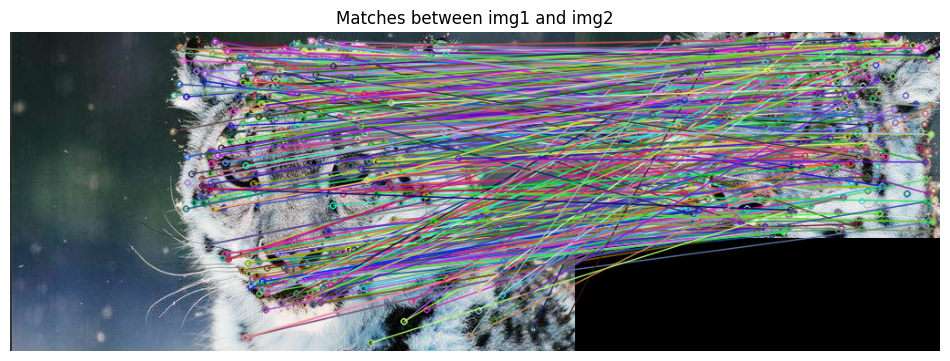

In [16]:
bf = cv2.BFMatcher()

matches = bf.knnMatch(descriptors1, descriptors2, k=2)

good_matches = []
for m, n in matches:
    good_matches.append(m)

img_matches = cv2.drawMatches(pic1, keypoints1, pic2, keypoints2, good_matches, None)

plt.figure(figsize=(12,16))
plt.imshow(img_matches)
plt.title('Matches between img1 and img2'), plt.axis('off')
plt.show()


c:\Users\padidar\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


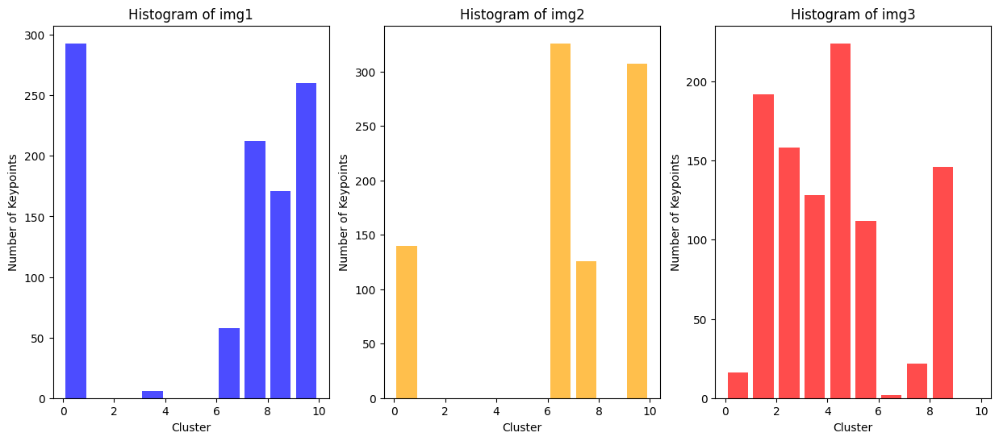

In [88]:
from sklearn.cluster import KMeans

def extract_keypoints(image, num_keypoints):
    sift = cv2.SIFT_create() 
    keypoints, descriptors = sift.detectAndCompute(image, None)

    keypoints = sorted(keypoints, key=lambda x: -x.response)[:num_keypoints]
    return np.array([keypoint.pt for keypoint in keypoints]), descriptors

img1_keypoints, img1_descriptors = extract_keypoints(pic1, 1000)
img2_keypoints, img1_descriptors = extract_keypoints(pic2, 1000)
img3_keypoints, img3_descriptors = extract_keypoints(pic3, 1000)


all_keypoints = np.vstack([img1_keypoints, img2_keypoints, img3_keypoints])

kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(all_keypoints)

img1_clusters = kmeans.predict(img1_keypoints)
img2_clusters = kmeans.predict(img2_keypoints)
img3_clusters = kmeans.predict(img3_keypoints)

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.hist(img1_clusters, bins=range(11), rwidth=0.8, color='blue', alpha=0.7)
plt.title('Histogram of img1')
plt.xlabel('Cluster')
plt.ylabel('Number of Keypoints')

plt.subplot(1, 3, 2)
plt.hist(img2_clusters, bins=range(11), rwidth=0.8, color='orange', alpha=0.7)
plt.title('Histogram of img2')
plt.xlabel('Cluster')
plt.ylabel('Number of Keypoints')

plt.subplot(1, 3, 3)
plt.hist(img3_clusters, bins=range(11), rwidth=0.8, color='red', alpha=0.7)
plt.title('Histogram of img3')
plt.xlabel('Cluster')
plt.ylabel('Number of Keypoints')

plt.show()

واضح است که تصویر اول و دوم که در واقع تصویر یک چیز هستند و از لحاظ ویژگی، شبیه به هم هستند، هیستوگرام های مشابهی نیز دارند به این معنا که زاویه گرادیان در نقاط کلیدی زاویه های خاصی را دارد. اما همانطور که در مقایسه با تصویر سوم میبینیم، رابطه معناداری میان هیستوگرام تصویر سوم و دو تصویر اول وجود ندارد که این منطقی و مورد انتظار است چرا که تصویر سوم مستقل از تصویر اول بوده و بنابراین الزامی نیست که زاویه های گرادیان در محل نقاط کلیدی مشابه زاویه های گرادیان در محل نقاط کلیدی تصویر باشد.

بنظر میرسد که میتوان از این ویژگی که تصاویری که به یک شی خاص متعلق هستند هیستوگرام های شبیه هم دارند استفاده کرد و طبقه بند انجام داد.
حال فرض کنید که برای حالت ساده شده دو کلاسه سگ و گربه این کار را انجام دهیم، حالات بیشتر از حالت دو کلاسه قابل بدست آمدن هستند.

برای اینکار ابتدا از داده های آموزش، هیستوگرام های هر دو کلاس را ترجیح داده و مدل خود را روی ویژگی ظاهری هیستوگرام یا اطلاعاتی که آن در اختیارمان قرار میدهد، برحسب ترشهولد و ستون های مختلف بدست می آوریم.

سپس در فاز تست، هیستوگرام هر نمونه تست را بدست آورده و با هیستوگرام بدست آمده از قسمت آموزش برای هر دو کلاس مقایسه میکنیم و به هرکدام شبیه تر بود لیبل همان کلاس را برای او انتخاب میکنیم.